# Определение шумов окружающей среды для построения прокторинговой системы

## Выбор данных для исследования
В выбранном нами датасете содержатся звуковые файлы формата .wav, размеченные на 10 следующих классов:
```
0 = air_conditioner
1 = car_horn
2 = children_playing
3 = dog_bark
4 = drilling
5 = engine_idling
6 = gun_shot
7 = jackhammer
8 = siren
9 = street_music
```


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"

In [ ]:
%cd /content/gdrive/My Drive/Kaggle

/content/gdrive/My Drive/Kaggle


In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/chrisfilo/urbansound8k'
od.download(dataset_url)

Skipping, found downloaded files in "./urbansound8k" (use force=True to force download)


In [ ]:
import IPython.display as ipd
import librosa
import librosa.display

In [ ]:
import os
import glob
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

In [ ]:
print(os.getcwd())

/content/gdrive/My Drive/Kaggle


Посмотрим на звуковые данные из датасета:

In [ ]:
audios = glob.glob(os.path.join("./urbansound8k/*/*.wav"), recursive = True)

print(f"Всего аудиофайлов : {len(audios)}")

Всего аудиофайлов : 8732


In [ ]:
audios[:10]

['./urbansound8k/fold1/101415-3-0-2.wav',
 './urbansound8k/fold1/101415-3-0-3.wav',
 './urbansound8k/fold1/101415-3-0-8.wav',
 './urbansound8k/fold1/102106-3-0-0.wav',
 './urbansound8k/fold1/102305-6-0-0.wav',
 './urbansound8k/fold1/102842-3-0-1.wav',
 './urbansound8k/fold1/102842-3-1-0.wav',
 './urbansound8k/fold1/102842-3-1-5.wav',
 './urbansound8k/fold1/102842-3-1-6.wav',
 './urbansound8k/fold1/103074-7-0-0.wav']

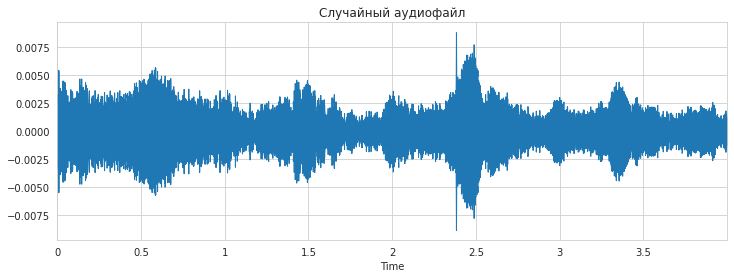

In [ ]:
plt.figure(figsize = (12, 4))
play_audio = random.choice(audios)
data, sample_rate = librosa.load(play_audio)
librosa.display.waveplot(data)
plt.title("Случайный аудиофайл")
ipd.Audio(play_audio)

#### Не всегда можно увидеть закономерности в спектограме рассматриваемого звука

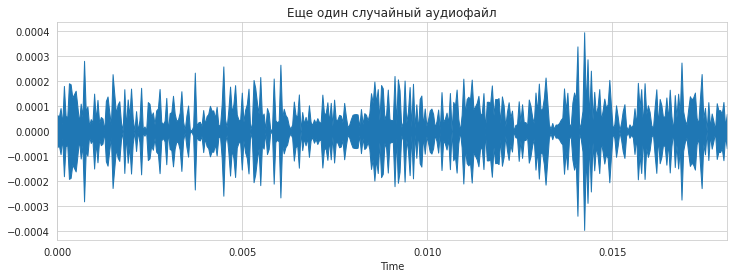

In [ ]:
plt.figure(figsize = (12, 4))
play_audio = random.choice(audios)
data, sample_rate = librosa.load(play_audio, sr = 100)
librosa.display.waveplot(data)
plt.title("Еще один случайный аудиофайл")
ipd.Audio(play_audio)

### Визуализация одного и того же аудиофайла с разной частотой дискретизации

Чем выше частота дискретизации, тем выше четкость графика, потому что в таком случае имеем меньше ошибок при попытке воссоздать исходный звук с большим количеством сэмплов и наоборот.

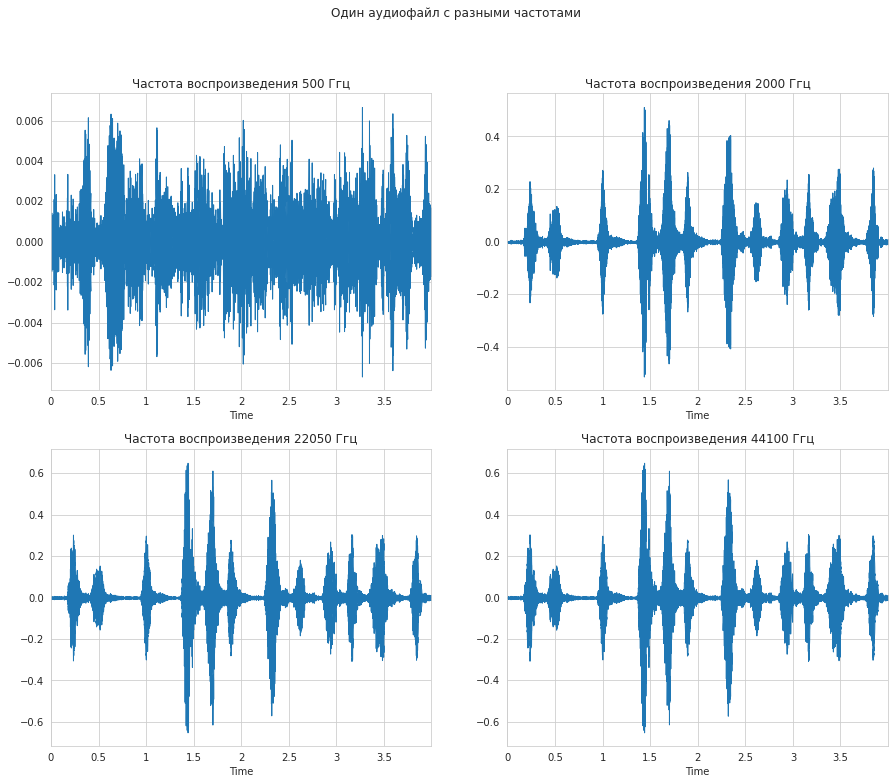

In [ ]:
fig, axs = plt.subplots(2, 2, figsize = (15, 12))
fig.suptitle("Один аудиофайл с разными частотами")
axs = np.reshape(axs,-1)
play_audio = random.choice(audios)
srs = [500, 2000, 22050, 44100]
for ax,sr in zip(axs,srs):
  try:
    data, sample_rate = librosa.load(play_audio, sr = sr)
    librosa.display.waveplot(data, sr = sample_rate, ax = ax)
    ax.set_title(f"Частота воспроизведения {sr} Ггц")
  except:
    print("Ошибка воспроизведения аудио")

ipd.Audio(play_audio)

### Посмотрим на метаданные для выбранного набора данных

In [ ]:
metadata = pd.read_csv("./urbansound8k/UrbanSound8K.csv")
metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


#### Выбираем случайную строку, содержащую данные об аудио каждого класса

In [ ]:
unique_audios = metadata.groupby(['class']).apply(lambda sub_df : sub_df.sample()).reset_index(drop = True)
unique_audios

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,73524-0-0-54.wav,73524,27.000000,31.000000,1,10,0,air_conditioner
1,7389-1-0-7.wav,7389,3.500000,7.500000,2,4,1,car_horn
2,71173-2-0-103.wav,71173,51.500000,55.500000,2,5,2,children_playing
3,203355-3-0-0.wav,203355,42.985765,44.114000,2,6,3,dog_bark
4,147764-4-0-0.wav,147764,0.441828,2.143685,1,1,4,drilling
5,201988-5-0-17.wav,201988,10.171607,14.171607,1,7,5,engine_idling
6,159701-6-4-0.wav,159701,7.336318,9.650942,1,5,6,gun_shot
7,178260-7-7-0.wav,178260,90.448308,91.471975,1,5,7,jackhammer
8,107357-8-1-18.wav,107357,168.017232,172.017232,2,7,8,siren
9,77769-9-0-2.wav,77769,1.000000,5.000000,2,3,9,street_music


Визуализируем отобранные метаданные:

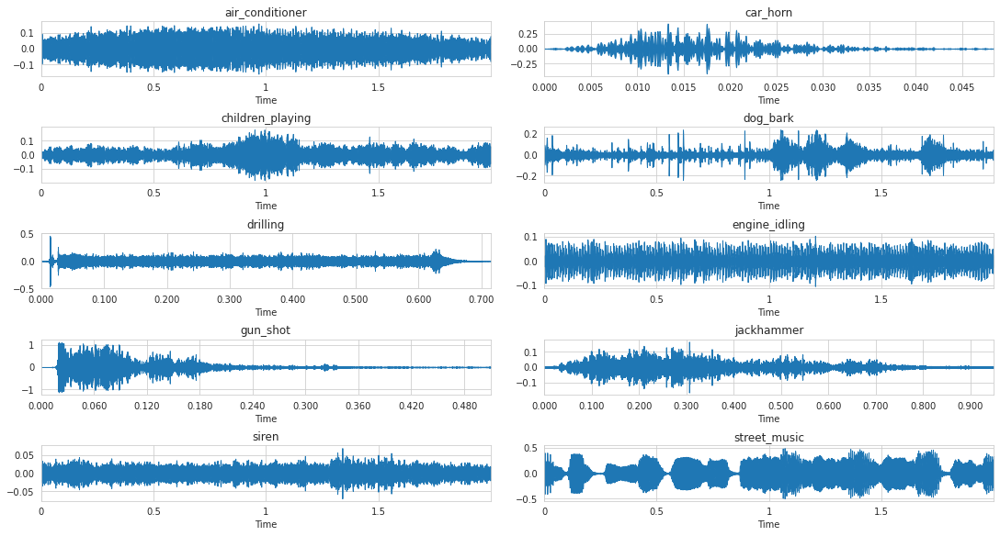

In [ ]:
fig, axs = plt.subplots(5, 2, figsize = (15, 8), constrained_layout = True)
axs = np.reshape(axs, -1)

for (index, row), ax in zip(unique_audios.iterrows(),axs):
  ax.set_title(row.values[-1])
  data, sr = librosa.load(f"./urbansound8k/fold{row.values[-3]}/" + row.values[0])
  _ = librosa.display.waveplot(data, sr = sample_rate, ax = ax)



Теперь посмотрим, сколько звуков принадлежат к каждому из 10 классов разметки

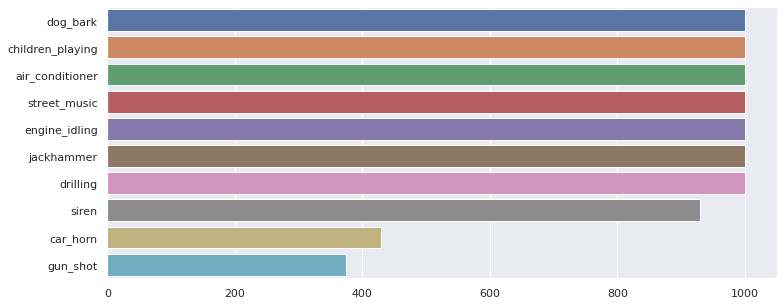

In [ ]:
instance_counts = metadata['class'].value_counts()
sns.set(rc={'figure.figsize':(12, 5)})
sns.barplot(x = instance_counts.values, y = instance_counts.index, orient = 'h')

Все классы кроме car_horn и gun_shot содержат примерно одинаковое количество размеченных объектов.

Обрабатываем аудиофайлы формата .wav из датасета

In [ ]:
import pandas as pd
import numpy as np
import os
import struct
from scipy.io import wavfile as wav
import matplotlib.pyplot as plt
import IPython.display as ipd

In [ ]:
data = pd.read_csv("./urbansound8k/UrbanSound8K.csv")

Нужно преобразовать данные таким образом, чтобы все они имели одинаковую форму и легко обрабатывались с помощью моделей машинного обучения.

Большая часть наших данных имеет частоту дискретизации 44,1 кГц. Допустим, мы хотим выполнить повторную выборку наших данных до 22,05 кГц. 44,1 кГц обеспечивает лучшее качество звука, но для целей классификации звука достаточно 22,05 кГц, чтобы уловить разницу звуков. И наша модель будет работать быстрее, если размер каждого данных станет вдвое меньше его первоначального размера.

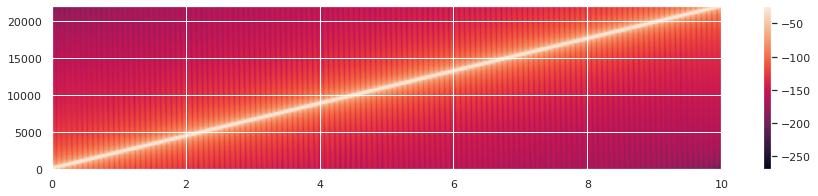

In [ ]:
from scipy.signal import chirp
import soundfile as sf
fs = 44100
T = 10
t = np.linspace(0, T, T*fs, endpoint=False)
w = chirp(t, f0=20, f1=22050, t1=T, method='linear')
sf.write('sine_sweep_44100.wav', w, fs)
plt.figure(figsize=(15,3))
plt.specgram(w, Fs=44100)
plt.colorbar()
_=plt.axis((0,10,0,22050))
ipd.Audio('sine_sweep_44100.wav')

Мы видим спектр частот с течением времени. Поскольку наша синусоида началась с 20 Гц, затем ее высота увеличивается, пока не достигнет 22,05 кГц.

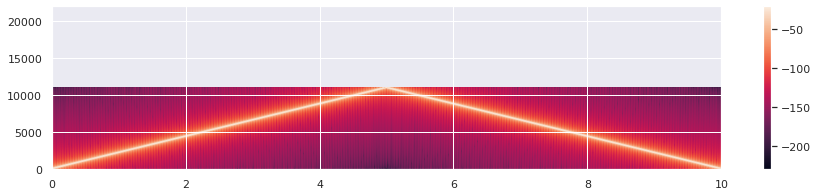

In [ ]:
down_sampled = w[::2]
sf.write('sine_sweep_downsampled.wav', down_sampled, 22050)
plt.figure(figsize = (15, 3))
plt.specgram(down_sampled, Fs = 22050)
plt.colorbar()
_=plt.axis((0,10,0,22050))
ipd.Audio('sine_sweep_downsampled.wav')

В этом случае сигнал сначала должен быть преобразован фильтром нижних частот, затем следует выбрать любую другую выборку.
Кроме того, в случае повышения дискретизации нам может потребоваться интерполяция, чтобы получить выборки, которые не были включены в исходный дискретизированный сигнал.

**MFCC**

MFCC, по сути, подобны преобразованию сигнала Фурье, однако MFCC используют масштабирование Mel, чтобы попытаться смоделировать способ восприятия звуков аудиосистемой человеческого слуха, а не описывать их на основе чисто частоты (Гц). Это означает, что MFCC должен представлять текстуру или тембр сигнала (плач ребенка) таким, каким мы могли бы его услышать (например, "пронзительный" крик или "недовольный" крик).

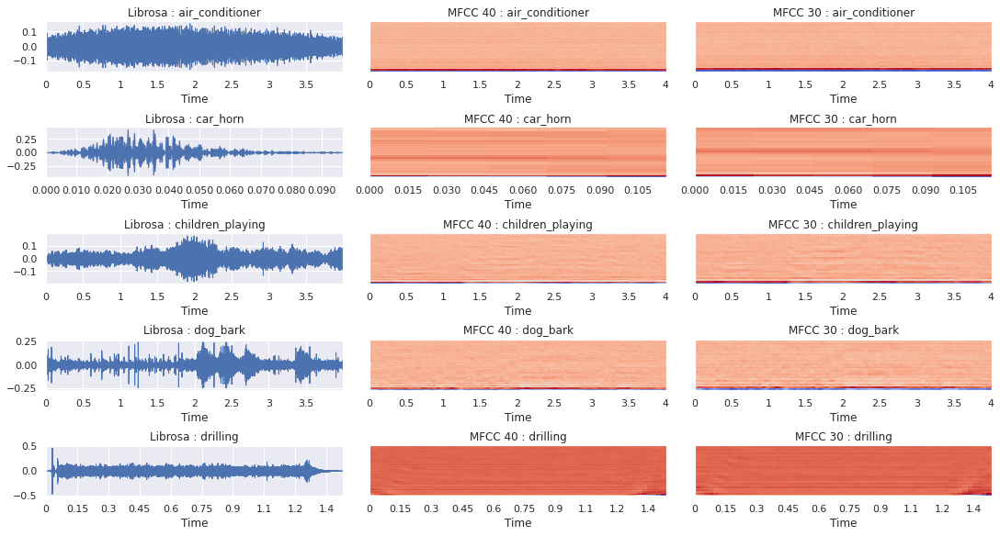

In [ ]:
unique_audios_5 = unique_audios.head()
fig, axs = plt.subplots(5,3,figsize=(15,8),constrained_layout=True)

for (index,row),ax in zip(unique_audios_5.iterrows(),axs):

  file_path = f"./urbansound8k/fold{row.values[-3]}/" + row.values[0]
  ax[0].set_title(f"Librosa : {row.values[-1]}")
  data, sr = librosa.load(file_path)
  _ = librosa.display.waveplot(data, sr=sr, ax=ax[0])

  ax[1].set_title(f"MFCC 40 : {row.values[-1]}")
  mfccs = librosa.feature.mfcc(data, n_mfcc = 40)
  librosa.display.specshow(mfccs, x_axis ='time', ax = ax[1])

  ax[2].set_title(f"MFCC 30 : {row.values[-1]}")
  mfccs = librosa.feature.mfcc(data, n_mfcc = 30)
  librosa.display.specshow(mfccs, x_axis = 'time', ax = ax[2])

In [ ]:
dat1, sampling_rate1 = librosa.load('./urbansound8k/fold5/100032-3-0-0.wav')
arr = librosa.feature.melspectrogram(y=dat1, sr=sampling_rate1)
arr.shape

(128, 14)

Извлекаем признаки из данных.

In [ ]:
def features_extract(file):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast')
    feature = librosa.feature.mfcc(y = audio,sr = sample_rate, n_mfcc = 40)
    feature_norm = (feature - feature.mean())/feature.std()
    scaled_feature = np.mean(feature_norm.T, axis = 0)
    return scaled_feature

In [ ]:
extracted = []
file_path = './urbansound8k'

In [ ]:
%system nvidia-smi

['Tue Jun 28 05:38:57 2022       ',
 '+-----------------------------------------------------------------------------+',
 '| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |',
 '|-------------------------------+----------------------+----------------------+',
 '| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |',
 '| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |',
 '|                               |                      |               MIG M. |',
 '|===============================+======================+======================|',
 '|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |',
 '| N/A   51C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |',
 '|                               |                      |                  N/A |',
 '+-------------------------------+----------------------+----------------------+',
 '                                      

In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
from tqdm import tqdm

In [ ]:
for index_num, row in tqdm(metadata.iterrows()):
    file_name = os.path.join(os.path.abspath(file_path), 'fold' + str(row["fold"])+ '/', str(row['slice_file_name']))
    final_class_labels = row['class']
    data = features_extract(file_name)
    extracted.append([data,final_class_labels])

3555it [20:46,  2.39it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1323
  n_fft, y.shape[-1]
8326it [48:03,  3.23it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1103
  n_fft, y.shape[-1]
8329it [48:04,  3.72it/s]/usr/local/lib/python3.7/dist-packages/librosa/core/spectrum.py:224: UserWarning: n_fft=2048 is too small for input signal of length=1523
  n_fft, y.shape[-1]
8732it [50:17,  2.89it/s]


In [ ]:
df_extracted = pd.DataFrame(extracted, columns = ['feature', 'label'])
df_extracted['fold'] = metadata['fold']
df_extracted.head()

,feature,label,fold
0,"[-4.364279, 1.7399222, -2.5809777, -0.88807017...",dog_bark,5
1,"[-5.889389, 1.6368701, -0.6791616, 0.954176, 0...",children_playing,5
2,"[-5.933864, 1.6941134, -0.54209054, 0.78332925...",children_playing,5
3,"[-5.9232674, 1.5859519, -0.43936306, 0.8789803...",children_playing,5
4,"[-5.923137, 1.6248747, -0.6416325, 0.9071426, ...",children_playing,5


In [ ]:
df_extracted.to_csv('audiodata.csv')
!cp audiodata.csv "/content/gdrive/My Drive/Kaggle"

cp: 'audiodata.csv' and '/content/gdrive/My Drive/Kaggle/audiodata.csv' are the same file


In [ ]:
!pip install torchaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Activation , Dropout
from keras.utils import np_utils
from sklearn.metrics import accuracy_score

#### Строим нейросетевую модель

In [ ]:
le = LabelEncoder()
y = np.array(df_extracted.label.tolist())
filter_size = 3
y = np_utils.to_categorical(le.fit_transform(y))
num_labels = y.shape[1]

In [ ]:
model = Sequential()
model.add(Dense(512, input_shape = (40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(128))
model.add(Dense(num_labels))
model.add(Activation('softmax'))
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics = ['accuracy'],
)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               20992     
                                                                 
 activation (Activation)     (None, 512)               0         
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 activation_1 (Activation)   (None, 256)               0         
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               3

Подготавливаем данные из датафрейма, содержащего кодированные аудиозаписи и обучаем модель нейросети.

In [ ]:
predicted = []
actual = []

In [ ]:
for i in range(1, 11):
    validation_data = df_extracted[df_extracted['fold'] == i]
    train_data = df_extracted[df_extracted['fold'] != i]
    x = np.array(train_data.feature.tolist())
    y = np.array(train_data.label.tolist())
    x_val = np.array(validation_data.feature.tolist())
    y_val = np.array(validation_data.label.tolist())
    y = np_utils.to_categorical(le.fit_transform(y))
    y_val = np_utils.to_categorical(le.fit_transform(y_val))
    fitting = model.fit(x, y, batch_size = 64, epochs = 10, validation_data = (x_val, y_val), shuffle = False)
    pred = model.predict(x_val)
    predicted.append(pred)
    actual.append(y_val)

Epoch 1/10
123/123 [==============================] - 0s 3ms/step - loss: 0.2917 - accuracy: 0.8988 - val_loss: 0.1405 - val_accuracy: 0.9393
Epoch 2/10
123/123 [==============================] - 0s 3ms/step - loss: 0.2733 - accuracy: 0.9109 - val_loss: 0.1599 - val_accuracy: 0.9324
Epoch 3/10
123/123 [==============================] - 1s 5ms/step - loss: 0.2703 - accuracy: 0.9113 - val_loss: 0.2276 - val_accuracy: 0.9267
Epoch 4/10
123/123 [==============================] - 1s 6ms/step - loss: 0.2705 - accuracy: 0.9044 - val_loss: 0.2754 - val_accuracy: 0.9233
Epoch 5/10
123/123 [==============================] - 1s 5ms/step - loss: 0.2461 - accuracy: 0.9158 - val_loss: 0.2038 - val_accuracy: 0.9336
Epoch 6/10
123/123 [==============================] - 1s 7ms/step - loss: 0.2500 - accuracy: 0.9139 - val_loss: 0.2504 - val_accuracy: 0.9244
Epoch 7/10
123/123 [==============================] - 1s 6ms/step - loss: 0.2651 - accuracy: 0.9041 - val_loss: 0.1927 - val_accuracy: 0.9301
Epoch 

##### Посмотрим, какая в среднем была точность прогноза на обучающей выборке

In [ ]:
acc = []
for i in range(0, 10):
    predict_conv = np.argmax(predicted[i], axis=1)
    actual_conv = np.argmax(actual[i], axis = 1)
    acc.append(accuracy_score(actual_conv, predict_conv))
print("Точность прогноза для 10 эпох", np.mean(acc))

Точность прогноза для 10 эпох 0.7423523949886691


#### Визуализируем значения функции потерь во время обучения модели

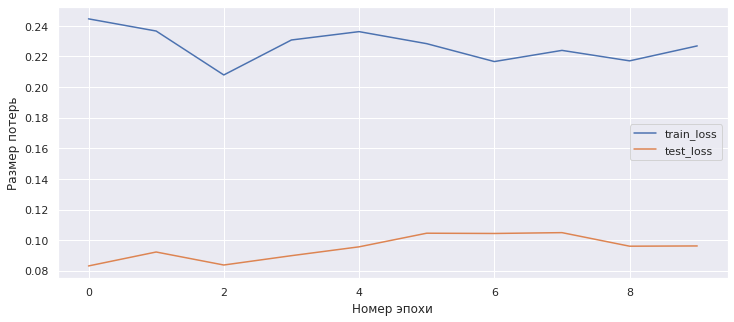

In [ ]:
metrics = fitting.history
plt.plot(fitting.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['train_loss', 'test_loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Размер потерь')
plt.show()

#### Визуализируем значения выбранной метрики после обучения модели

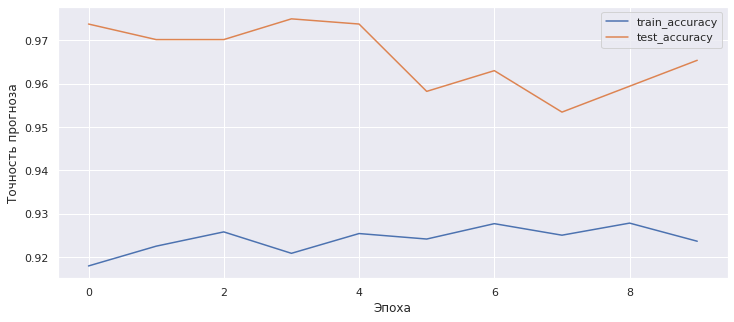

In [ ]:
plt.plot(fitting.history['accuracy'], label = 'train_accuracy')
plt.plot(fitting.history['val_accuracy'], label = 'test_accuracy')
plt.xlabel('Эпоха')
plt.ylabel('Точность прогноза')
plt.legend()
plt.grid(True)

Протестируем нашу нейросеть на каком-нибудь файле из датасета:

In [ ]:
def feature_extractor(path):
    data, simple_rate = librosa.load(path)
    data = librosa.feature.mfcc(data, n_mfcc = 40)
    data = np.mean(data,axis=1)
    return data

In [ ]:
classes = metadata.groupby('classID')['class'].unique()
classes

classID
0     [air_conditioner]
1            [car_horn]
2    [children_playing]
3            [dog_bark]
4            [drilling]
5       [engine_idling]
6            [gun_shot]
7          [jackhammer]
8               [siren]
9        [street_music]
Name: class, dtype: object

In [ ]:
def predict(path):
    audio = np.array([feature_extractor(path)])
    classid = np.argmax(model.predict(audio)[0])
    print('Выбранная аудиозапись относится к классу', classes[classid][0],'\n\n')
    ipd.display(ipd.Audio(path))

In [ ]:
n = 5
for i in range(n):
  predict(random.choice(audios))

Выбранная аудиозапись относится к классу dog_bark 




Выбранная аудиозапись относится к классу street_music 




Выбранная аудиозапись относится к классу street_music 




Выбранная аудиозапись относится к классу street_music 




Выбранная аудиозапись относится к классу engine_idling 




#### Бинарная классификация действий человека на основе полученного шума на фоне

Грузим размеченные нейросетевой моделью данные по рассматриваемому аудио

In [ ]:
regr_df = pd.read_csv('audiodata.csv')
regr_df.drop(columns = regr_df.columns[0], axis = 1, inplace = True)
regr_df.head(5)

,feature,label,fold
0,[-4.364279 1.7399222 -2.5809777 -0.888070...,dog_bark,5
1,[-5.8893890e+00 1.6368701e+00 -6.7916161e-01 ...,children_playing,5
2,[-5.9338641e+00 1.6941134e+00 -5.4209054e-01 ...,children_playing,5
3,[-5.9232674e+00 1.5859519e+00 -4.3936306e-01 ...,children_playing,5
4,[-5.92313719e+00 1.62487471e+00 -6.41632497e-...,children_playing,5


Нам понадобится только метка класса, на основе которой будем выяснять, подозрительна ли шумовая активность, рассматриваемая прокторинговой системой.

In [ ]:
regr_df_new = regr_df.copy()
regr_df_new.drop(columns = regr_df.columns[0], axis = 1, inplace = True)
regr_df_new.drop(columns = regr_df.columns[-1], axis = 1, inplace = True)

In [ ]:
noises = regr_df_new['label'].unique()
n = len(noises)
noises

array(['dog_bark', 'children_playing', 'car_horn', 'air_conditioner',
       'street_music', 'gun_shot', 'siren', 'engine_idling', 'jackhammer',
       'drilling'], dtype=object)

In [ ]:
regr_df_new['code_label'] = [dict(zip(noises, range(n)))[label] for label in regr_df_new.label]
regr_df_new.head(5)

,label,code_label
0,dog_bark,0
1,children_playing,1
2,children_playing,1
3,children_playing,1
4,children_playing,1


In [ ]:
ok_noises = ['dog_bark', 'children_playing', 'air_conditioner', 'siren', 'drilling']

In [ ]:
regr_df_new['label_class'] = np.where(regr_df_new['label'].isin(ok_noises), 1, 0)
regr_df_new.head(5)

,label,code_label,label_class
0,dog_bark,0,1
1,children_playing,1,1
2,children_playing,1,1
3,children_playing,1,1
4,children_playing,1,1


#### Построим модель бинарной классификации

Наш целевой признак - **true_behavior_class** <br>
Регрессор - признак **code_label** <br>
Вид модели - **Логистическая регрессия**

In [ ]:
from sklearn.model_selection import train_test_split
from matplotlib.colors import ListedColormap
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
X = regr_df_new['code_label']
y = regr_df_new['label_class']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [ ]:
model = LogisticRegression(fit_intercept = 1, solver = 'liblinear', random_state = 0)
res = model.fit(np.array(X_train).reshape(-1, 1), np.array(y_train))

In [ ]:
y_pred = model.predict(np.array(X_test).reshape(-1, 1))

#### Визуализация результатов работы модели логистической регрессии

###### Матрица ошибок

Text(0.5, 257.44, 'Предсказанный класс')

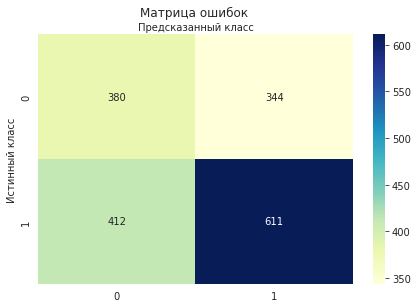

In [ ]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
class_names = [0, 1]
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
sns.heatmap(pd.DataFrame(cnf_matrix), annot = True, cmap = "YlGnBu", fmt = 'g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Матрица ошибок ', y = 1.5)
plt.ylabel('Истинный класс')
plt.xlabel('Предсказанный класс')

##### ROC-кривая

**ROC-кривая** - это график, позволяющий оценить качество разделения двух классов. <br>
**ROC AUC** - площадь под ROC кривой, чем выше значение - тем лучше. <br>
 0.5 - плохая классификация, не отличающаяся от равновероятностной, больше 0.75 - считается хорошая классификация

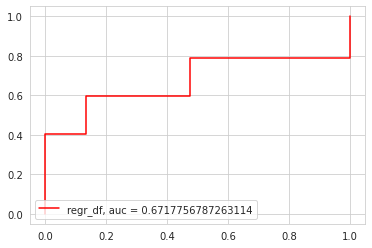

In [ ]:
y_pred_proba = model.predict_proba(np.array(X_test).reshape(-1, 1))[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr, tpr, label = "regr_df, auc = " + str(auc), color = 'red')
plt.legend(loc = 3)
plt.show()

##### Метрики модели логистической регрессии

In [ ]:
print("Значение accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Значение precision:", metrics.precision_score(y_test, y_pred))
print("Значение recall:", metrics.recall_score(y_test, y_pred))

Значение accuracy: 0.5672581568402977
Значение precision: 0.6397905759162303
Значение recall: 0.5972629521016618


Таким образом, видим, что модель логистической регрессии нуждается в улучшении или замене, поскольку согласно полученным метрикам, вероятность метки, полученной при классификации аудио, попасть в один из двух классов, близка к 0.5. <br>
Как вариант, можно воспользоваться одной из простейших нейросетевых моделей - перцептроном. <br>


Также стоит отметить, что для построения прокторинговой системы на основе анализа окружающих наблюдаемую персону шумов нужно будет размечать данные, содержащие шумы нескольких типов одновременно. <br>
Иными словами, проводить бинарную классификацию не по одному признаку, а по количеству всех типов найденных в аудиозаписи шумов. <br>